In [1]:
import pandas as pd 
import numpy as np
import re

##LDA stuff
import gensim
from gensim.utils import simple_preprocess
import nltk
from nltk.corpus import words
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

##cleaning stuff
from sklearn.metrics.pairwise import cosine_similarity
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

import gensim.corpora as corpora
import pyLDAvis
import pyLDAvis.gensim
from gensim.models import CoherenceModel

##plotting
from matplotlib import pyplot as plt
from matplotlib import colors as mcolors
import seaborn as sns

In [2]:
def preprocess_text(text):
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word.isalnum()]
    tokens = [word.lower() for word in tokens]
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    return tokens

In [3]:
def preprocess(text):
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word.isalnum()]
    tokens = [word.lower() for word in tokens]
    return tokens

In [4]:
def remove_non_english_words(text, valid_words):
    tokens = word_tokenize(text)
    ans = [w for w in tokens if w.lower() in valid_words]
    return ' '.join(ans)

def remove_stopwords(text):
    tokens = word_tokenize(text)
    ans = [w for w in tokens if w.lower() not in stop_words]
    return ' '.join(ans)

In [5]:
df_village = pd.read_csv('../../../data/processed/cleaned_village-hotel-changi-by-far-east-hospitality.csv')
df_park = pd.read_csv('../../../data/processed/cleaned_park-regis.csv')
df_grand = pd.read_csv('../../../data/processed/cleaned_grand-mercure-sg-roxy.csv')
df_paradox = pd.read_csv('../../../data/processed/cleaned_paradox-sg-merchant-court.csv')
df_crown = pd.read_csv('../../../data/processed/cleaned_crowne-plaza.csv')


df_combi = pd.concat([df_village, df_park, df_grand, df_paradox, df_crown])

In [19]:
##filter for year >= 2015
df_filtered = df_combi[df_combi['year'] >= 2015]

##preprocess text
nltk.download('stopwords')
nltk.download('words')
# Get the list of valid English words
english_words = set(words.words())
# set stopwords
sw = stopwords.words('english')
sw.extend(['regis', 'park_regis', 'changi', 'far_east', 'east_hospitality', 'village', 'grand_mercure', 'mercure', 'roxy',
          'paradox', 'merchant', 'merchant_court', 'crowne', 'crowne_plaza', 'crown', 'plaza', 'clark', 'quay'])
stop_words = set(sw)
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to C:\Users\Chen
[nltk_data]     Wei\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to C:\Users\Chen
[nltk_data]     Wei\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


## Stemmed

In [20]:
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_stopwords)
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['stem_tokens'] = df_filtered['stem_review'].apply(preprocess)

In [21]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_filtered['stem_tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_filtered['stem_tokens']]

In [24]:
## find best_coherence:
for i in range(2, 7):
    lda = gensim.models.ldamodel.LdaModel
    pre_ldamodel = lda(pre_corpus, num_topics=i, id2word=pre_dict, passes=15)
    
    precovid_coherence = CoherenceModel(model=pre_ldamodel, texts=df_filtered['stem_tokens'], dictionary=pre_dict, coherence='c_v')
    lda_coherence = precovid_coherence.get_coherence()
    print(f"The coherence score at topic {i} is {lda_coherence}")

The coherence score at topic 2 is 0.41381763755042256
The coherence score at topic 3 is 0.4094399976985413


KeyboardInterrupt: 

In [22]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=6, id2word=pre_dict, passes=15)

In [23]:
# For All-COVID
topics_pre_stem = pre_ldamodel.show_topics(formatted=False, num_words=20)
data_flat_pre = [word for word_list in df_filtered['stem_tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1556627539.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


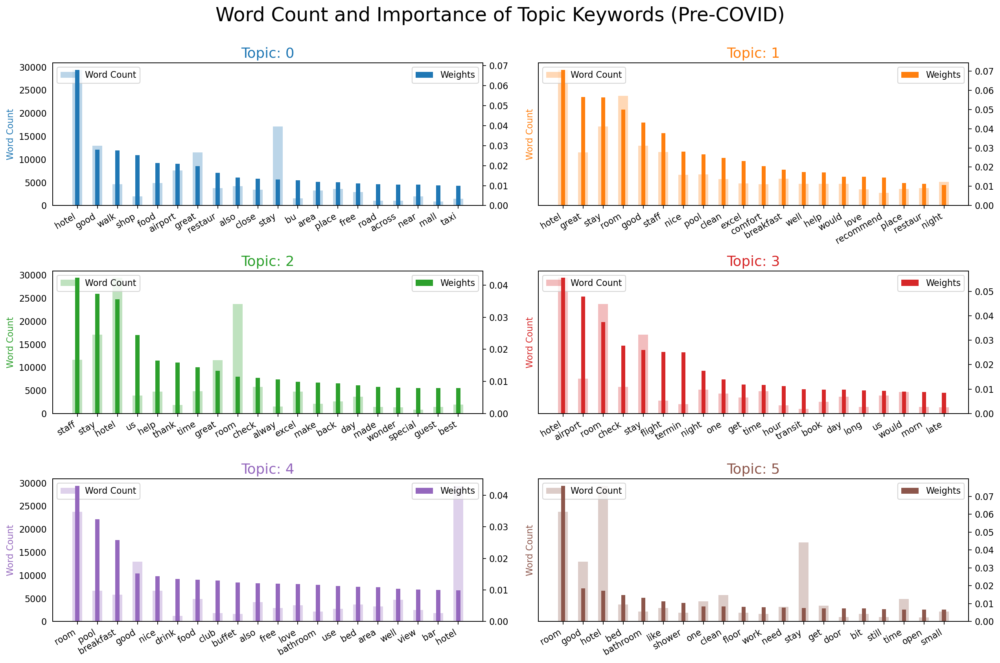

In [24]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre_stem, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

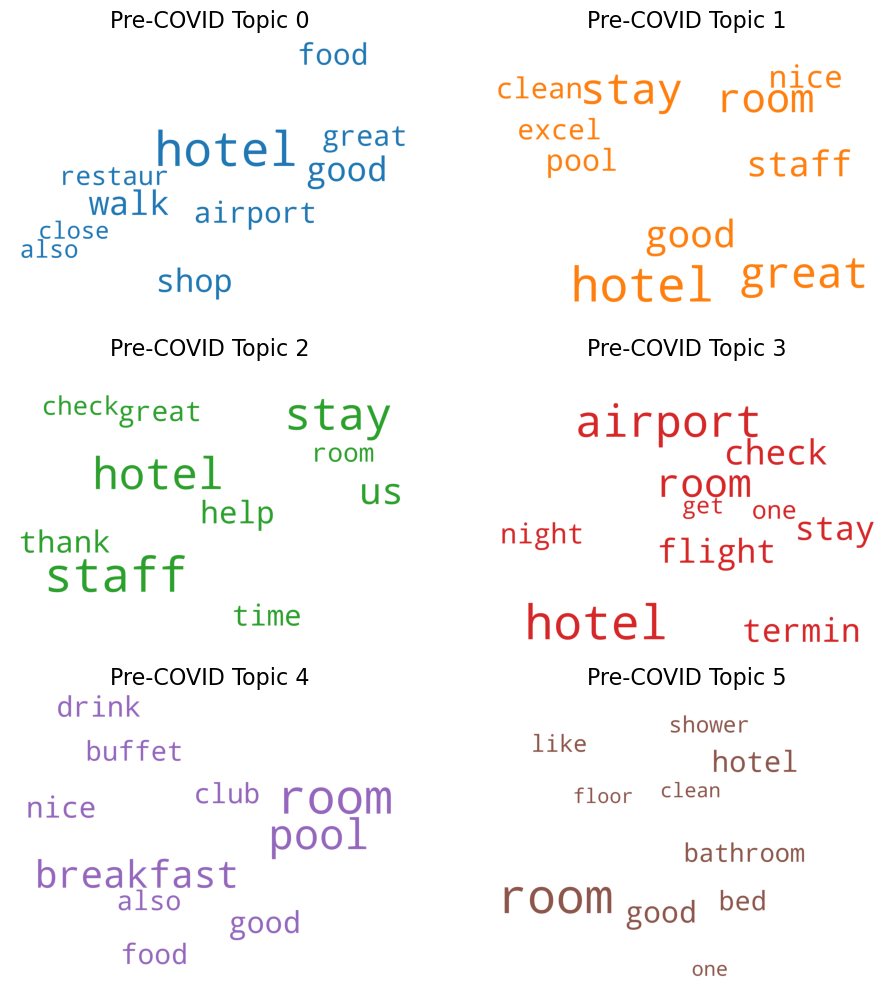

In [25]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(6):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [26]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Bigram

In [25]:
clean_data = df_filtered['stem_review'].apply(preprocess)
clean_data = clean_data.apply(lambda x: ' '.join(x))

In [26]:
from nltk import ngrams
bigrams_data = []

for d in clean_data:
    tokens = word_tokenize(d)
    bigrams_data.append(["_".join(w) for w in ngrams(tokens, 2)])


In [27]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_data)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_data]

lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=6, id2word=pre_dict, passes=15)

In [28]:
# For Pre-COVID
topics_pre_stembi = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_data for word in word_list]

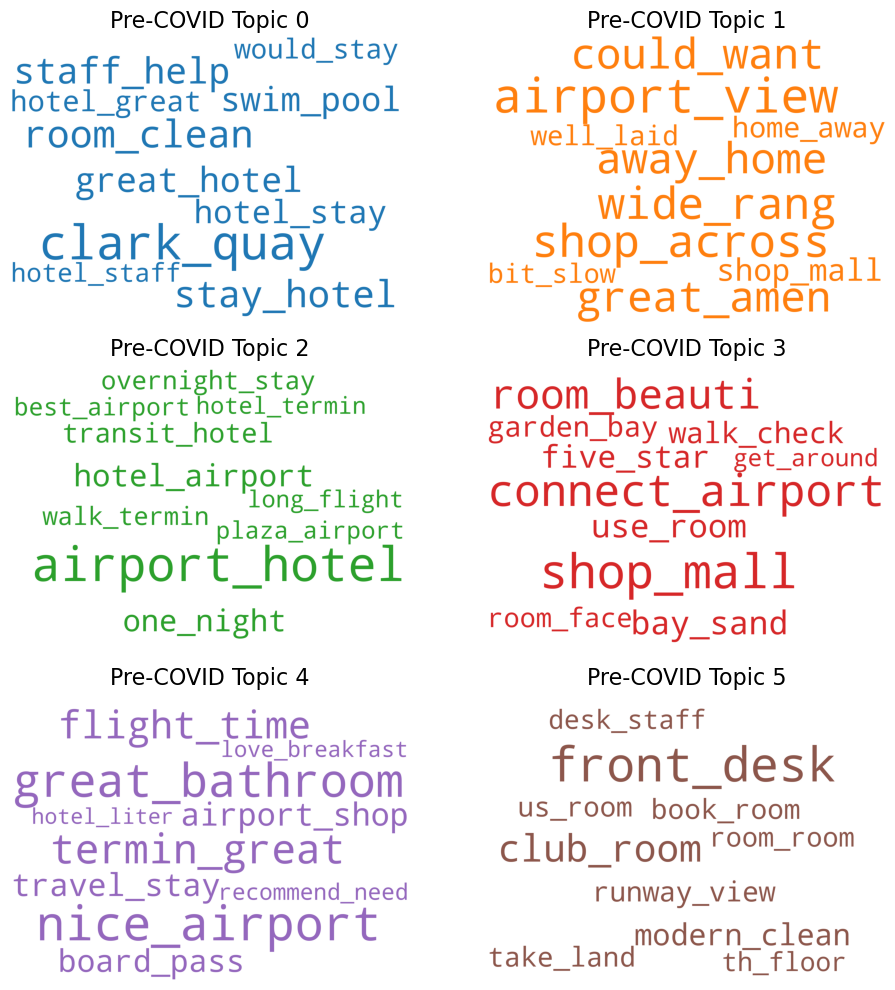

In [29]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(6):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Create WordClouds for each topic in the post-COVID dataset
clouds_post = []

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')
        
plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [30]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Lemmatized

In [31]:
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_stopwords)
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['lem_tokens'] = df_filtered['lem_review'].apply(preprocess)

In [32]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_filtered['lem_tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_filtered['lem_tokens']]

In [33]:
## find best_coherence:
for i in range(2, 7):
    lda = gensim.models.ldamodel.LdaModel
    pre_ldamodel = lda(pre_corpus, num_topics=i, id2word=pre_dict, passes=15)
    
    precovid_coherence = CoherenceModel(model=pre_ldamodel, texts=df_filtered['lem_tokens'], dictionary=pre_dict, coherence='c_v')
    lda_coherence = precovid_coherence.get_coherence()
    print(f"The coherence score at topic {i} is {lda_coherence}")

The coherence score at topic 2 is 0.3752323316073417
The coherence score at topic 3 is 0.3951180034480335
The coherence score at topic 4 is 0.39575564516896355
The coherence score at topic 5 is 0.4168651531640156
The coherence score at topic 6 is 0.4251517182507669


In [34]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=6, id2word=pre_dict, passes=15)

In [35]:
# For All
topics_pre_lem = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_filtered['lem_tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_18732\3711800261.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


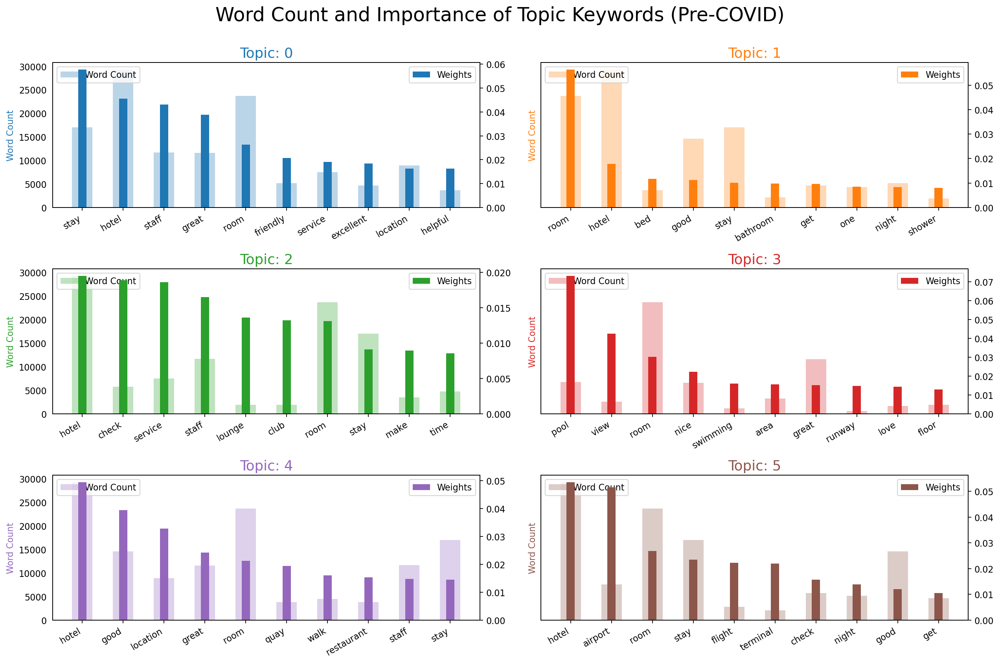

In [36]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre_lem, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

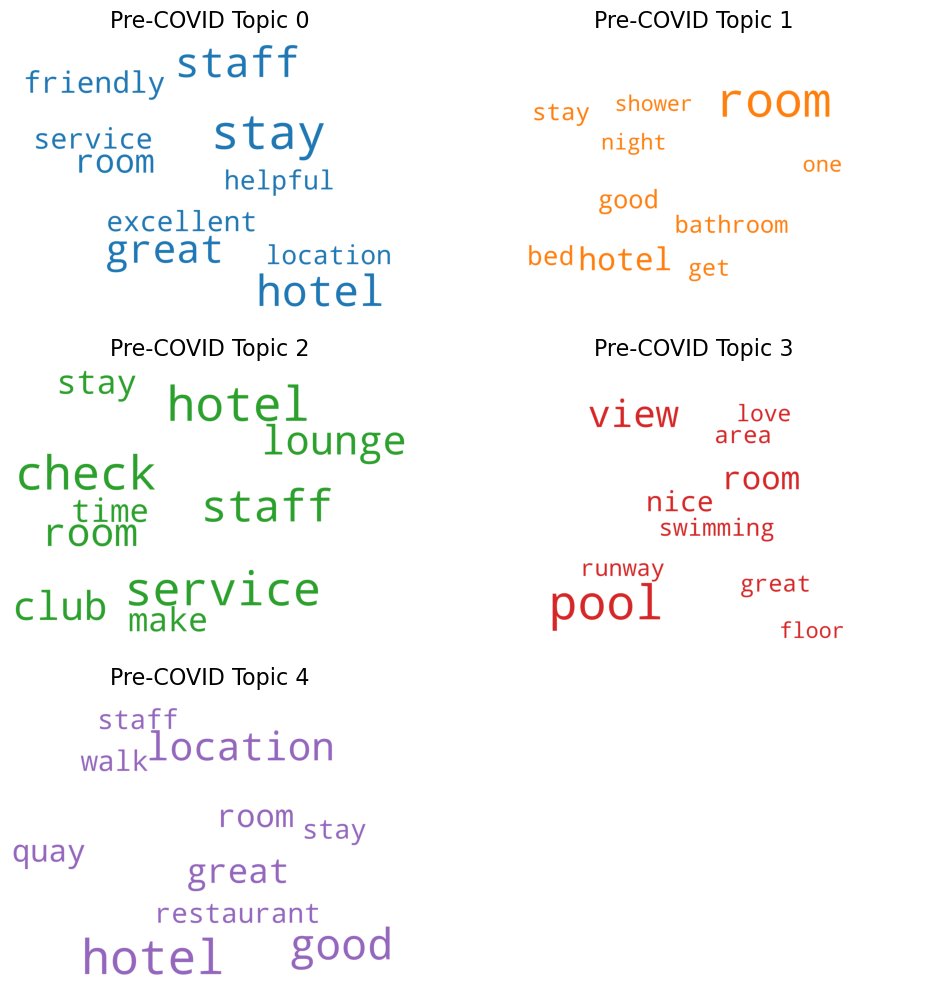

In [37]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [38]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Bigrams

In [39]:
clean_data = df_filtered['lem_review'].apply(preprocess)
clean_data = clean_data.apply(lambda x: ' '.join(x))

In [40]:
from nltk import ngrams
bigrams_data = []

for d in clean_data:
    tokens = word_tokenize(d)
    bigrams_data.append(["_".join(w) for w in ngrams(tokens, 2)])


In [42]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_data)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_data]

lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=6, id2word=pre_dict, passes=15)

In [43]:
# For Pre-COVID
topics_pre_lembi = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_data for word in word_list]

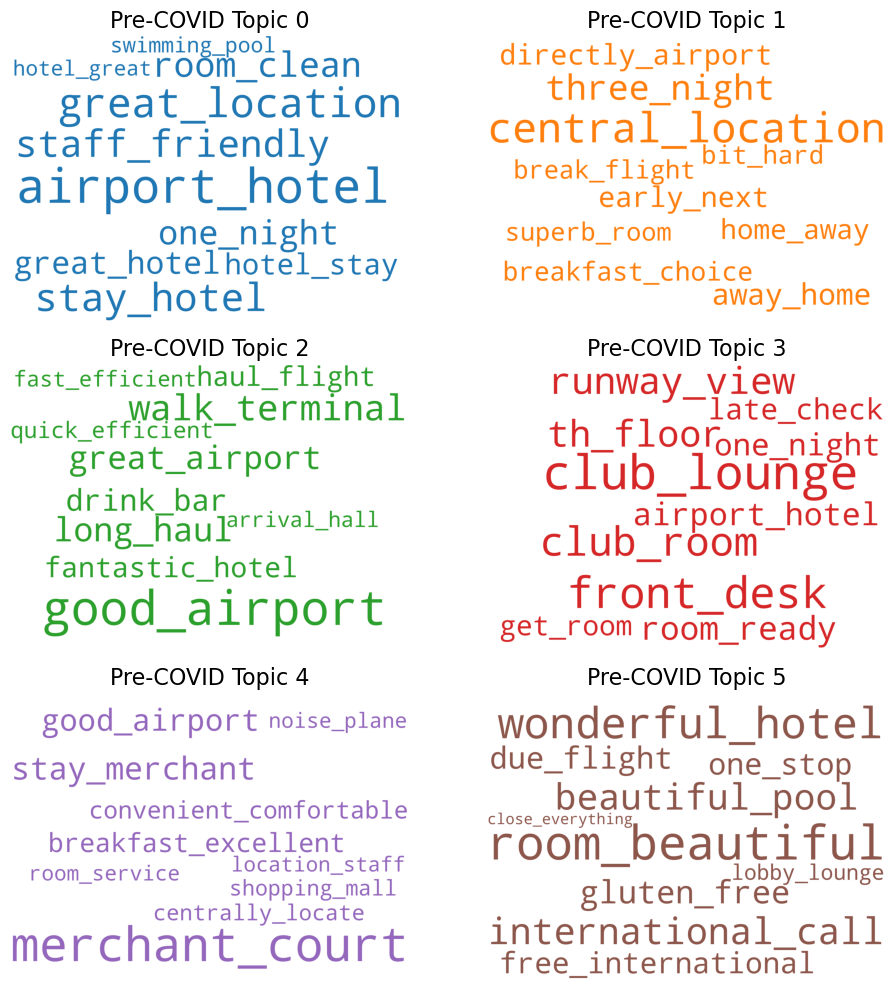

In [44]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(6):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [45]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Aspect Extraction

In [27]:
topics_pre_stem

[(0,
  [('hotel', 0.06798696),
   ('good', 0.027964115),
   ('walk', 0.02755009),
   ('shop', 0.025193797),
   ('food', 0.02122643),
   ('airport', 0.021013288),
   ('great', 0.019764109),
   ('restaur', 0.016344588),
   ('also', 0.01410577),
   ('close', 0.013409383),
   ('stay', 0.013032061),
   ('bu', 0.01263999),
   ('area', 0.011804434),
   ('place', 0.011715712),
   ('free', 0.01108692),
   ('road', 0.010614765),
   ('across', 0.01048299),
   ('near', 0.010462691),
   ('mall', 0.010031293),
   ('taxi', 0.009846578)]),
 (1,
  [('hotel', 0.07062195),
   ('great', 0.05646016),
   ('stay', 0.05616179),
   ('room', 0.04990508),
   ('good', 0.04326597),
   ('staff', 0.03765523),
   ('nice', 0.028164936),
   ('pool', 0.026656486),
   ('clean', 0.0247479),
   ('excel', 0.023246551),
   ('comfort', 0.020527659),
   ('breakfast', 0.018587708),
   ('well', 0.017378397),
   ('help', 0.017337978),
   ('would', 0.015056335),
   ('love', 0.01491179),
   ('recommend', 0.014553189),
   ('place', 

In [28]:
top_dict = {}
for i in topics_pre_stem:
    top_dict[i[0]] = []
    for j in i[1]:
        print(j)
        top_dict[i[0]].append(j[0])

('hotel', 0.06798696)
('good', 0.027964115)
('walk', 0.02755009)
('shop', 0.025193797)
('food', 0.02122643)
('airport', 0.021013288)
('great', 0.019764109)
('restaur', 0.016344588)
('also', 0.01410577)
('close', 0.013409383)
('stay', 0.013032061)
('bu', 0.01263999)
('area', 0.011804434)
('place', 0.011715712)
('free', 0.01108692)
('road', 0.010614765)
('across', 0.01048299)
('near', 0.010462691)
('mall', 0.010031293)
('taxi', 0.009846578)
('hotel', 0.07062195)
('great', 0.05646016)
('stay', 0.05616179)
('room', 0.04990508)
('good', 0.04326597)
('staff', 0.03765523)
('nice', 0.028164936)
('pool', 0.026656486)
('clean', 0.0247479)
('excel', 0.023246551)
('comfort', 0.020527659)
('breakfast', 0.018587708)
('well', 0.017378397)
('help', 0.017337978)
('would', 0.015056335)
('love', 0.01491179)
('recommend', 0.014553189)
('place', 0.011777474)
('restaur', 0.0112265535)
('night', 0.0107170325)
('staff', 0.042271227)
('stay', 0.037311126)
('hotel', 0.035562012)
('us', 0.024387758)
('help', 0.0

In [29]:
top_dict

{0: ['hotel',
  'good',
  'walk',
  'shop',
  'food',
  'airport',
  'great',
  'restaur',
  'also',
  'close',
  'stay',
  'bu',
  'area',
  'place',
  'free',
  'road',
  'across',
  'near',
  'mall',
  'taxi'],
 1: ['hotel',
  'great',
  'stay',
  'room',
  'good',
  'staff',
  'nice',
  'pool',
  'clean',
  'excel',
  'comfort',
  'breakfast',
  'well',
  'help',
  'would',
  'love',
  'recommend',
  'place',
  'restaur',
  'night'],
 2: ['staff',
  'stay',
  'hotel',
  'us',
  'help',
  'thank',
  'time',
  'great',
  'room',
  'check',
  'alway',
  'excel',
  'make',
  'back',
  'day',
  'made',
  'wonder',
  'special',
  'guest',
  'best'],
 3: ['hotel',
  'airport',
  'room',
  'check',
  'stay',
  'flight',
  'termin',
  'night',
  'one',
  'get',
  'time',
  'hour',
  'transit',
  'book',
  'day',
  'long',
  'us',
  'would',
  'morn',
  'late'],
 4: ['room',
  'pool',
  'breakfast',
  'good',
  'nice',
  'drink',
  'food',
  'club',
  'buffet',
  'also',
  'free',
  'love',


In [30]:
df_res = pd.DataFrame(top_dict)
df_res

,0,1,2,3,4,5
0,hotel,hotel,staff,hotel,room,room
1,good,great,stay,airport,pool,good
2,walk,stay,hotel,room,breakfast,hotel
3,shop,room,us,check,good,bed
4,food,good,help,stay,nice,bathroom
5,airport,staff,thank,flight,drink,like
6,great,nice,time,termin,food,shower
7,restaur,pool,great,night,club,one
8,also,clean,room,one,buffet,clean
9,close,excel,check,get,also,floor


In [31]:
df_res.to_csv('4-star LDA.csv')

## DP

In [32]:
import spacy
nlp = spacy.load("en_core_web_sm")

In [33]:
# Pass in LDA topics output to remove overlap words by choosing highest prob
def restruct_topics(topics): 
    word_prob_dict = {}
    for i in range(len(topics)):
        topic_num = topics[i][0]
        for word, prob in topics[i][1]:
            if word in word_prob_dict:
                word_prob_dict[word].append((topic_num, prob))
            else:
                ls = [(topic_num, prob)]
                word_prob_dict[word] = ls
    new_dict = {}
    for word in word_prob_dict:
        topic, highest_prob = max(word_prob_dict[word], key = lambda x: x[1])
        if topic in new_dict:
            new_dict[topic].append(word)
        else:
            ls = [word]
            new_dict[topic] = ls
    return new_dict

In [34]:
new_dict = restruct_topics(topics_pre_stem)

In [35]:
new_dict = restruct_topics(topics_pre_stem)
for x in new_dict:
    print(f'length topic {x}: {len(new_dict[x])}')

length topic 1: 14
length topic 0: 13
length topic 3: 14
length topic 4: 9
length topic 5: 13
length topic 2: 12


In [36]:
#takes in the dataframe and appends to each row (aspect, review) pair(s)
def dep_parse(data, new_dict):
    data['aspect_sentiment'] = np.empty((len(data), 0)).tolist()
    for i in range(len(data)):
        sentence = data['combined_review'][i]
        doc = nlp(sentence)
        aspect_sentiment = []
        for word in doc:
            cond = False
            for x in new_dict.values():
                if word.text in x:
                    cond = True
                    break
            if not cond:
                continue
            if word.pos_ == 'NOUN': 
                for j in word.lefts:
                    #print(j, word, j.dep_, j.pos_)
                    if j.dep_ == 'amod' and j.pos_ == 'ADJ':
                        tup = [word, j, list(new_dict.values()).index(x)]
                        #print(tup)
                        aspect_sentiment.append(tup)
                    for k in j.lefts:
                        if k.dep_ == 'advmod':
                            #print(word, j ,k)
                            tup = (word, k.text + ' ' + j.text)
                            aspect_sentiment.append(tup)
                            if (word, j) in aspect_sentiment:
                                aspect_sentiment.remove([word, j, list(new_dict.values()).index(x)])
        data['aspect_sentiment'][i] = aspect_sentiment

In [37]:
df_filtered = df_filtered.reset_index()

In [38]:
dep_parse(df_filtered, new_dict)

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9280\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

In [39]:
df_filtered['aspect_sentiment']

0                                 [[hotel, affordable, 0]]
1                                 [[room, comfortable, 4]]
2                     [[place, right, 0], [view, nice, 3]]
3                     [[room, ️, 4], [view, beautiful, 3]]
4        [[room, double, 4], [room, twin, 4], [hotel, d...
                               ...                        
18595    [[hotel, Excellent, 0], [hotel, amazing, 0], [...
18596    [[view, Great, 3], [room, new, 4], [area, nice...
18597    [[hotel, cool, 0], (hotel, very cool), [hotel,...
18598                                                   []
18599                                 [[hotel, proper, 0]]
Name: aspect_sentiment, Length: 18600, dtype: object